In [1]:
import networkx as nx
import pandas as pd
from joblib import Parallel, delayed
import os
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import plotly.express as px
from geopy.geocoders import Nominatim
from geopy.distance import geodesic
import numpy as np
import geopandas as gpd
from mpl_toolkits.axes_grid1 import make_axes_locatable

import graph_tool.all as gt
import math


ModuleNotFoundError: No module named 'graph_tool'

In [57]:
############################
# RELEVANT ISO CODES
############################

hs_codes = [    
    ############################
    # Gold -> Baseline
    ############################
    710812,
    
    ############################
    # Medicine and Antibiotics -> Baseline
    ############################
    300490, 294190,
    
    ############################
    # Aluminium
    ############################
    760110,
    
    ############################    
    # Steel
    ############################
    721810,
    
    ############################
    # Energy: Oil and Coal
    ############################
    270900, 270112,
    
    ############################
    # Semiconductors
    ############################
    853400
]

In [58]:
def merge_country_and_product_names(dataframe, country_codes, product_codes, export_col="i", import_col="j", product_col="k", hs_codes=hs_codes):
    """
    Merge country names and product descriptions into a dataframe based on country and product codes.

    Parameters:
    dataframe (pd.DataFrame): The main dataframe containing country and product codes.
    country_mapping (pd.DataFrame): A dataframe containing `country_code` and `country_name`.
    product_codes (pd.DataFrame): A dataframe containing `code` and `product_description`.
    export_col (str): The column in `dataframe` representing export country codes. Default is 'i'.
    import_col (str): The column in `dataframe` representing import country codes. Default is 'j'.
    product_col (str): The column in `dataframe` representing product codes. Default is 'k'.

    Returns:
    pd.DataFrame: A dataframe with `export_country`, `import_country`, and `product_description` columns added.
    """
    #####################
    # RELEVANT CARGOES
    #####################
    dataframe = dataframe[dataframe.k.isin(hs_codes)]
    
    #####################
    # COUNTRY NAMES
    #####################
    df = pd.merge(
        left=dataframe,
        right=country_codes[["country_code", "country_name"]],
        left_on=export_col,
        right_on="country_code",
        how="left"
    ).rename(columns={"country_name": "export_country"}).drop(columns=["country_code"], axis=1)

    df = pd.merge(
        left=df,
        right=country_codes[["country_code", "country_name"]],
        left_on=import_col,
        right_on="country_code",
        how="left"
    ).rename(columns={"country_name": "import_country"}).drop(columns=["country_code"], axis=1)
    
    #####################
    # PRODUCT DESCRIPTION
    #####################
    df = pd.merge(
        left=df,
        right=product_codes[["code", "description"]],
        left_on=product_col,
        right_on="code",
        how="left"
    ).drop(columns=["code"], axis=1)

    return df


In [59]:
def process_file(file):
    """
    Process a given CSV file to prepare it for analysis.

    This function reads a CSV file from the 'dataset' directory, merges it with
    country and product codes, and extracts the year from the filename.

    Args:
        file (str): The name of the file to process (e.g., 'data_Y2022.csv').

    Returns:
        tuple: A tuple containing:
            - year (str): The year extracted from the filename.
            - df (pd.DataFrame): A pandas DataFrame containing the processed data.
        If the filename does not contain a valid year, returns (None, None).
    """
    file_path = os.path.join(os.getcwd(), "dataset", file)
    df = pd.read_csv(file_path, low_memory=False)
    df = merge_country_and_product_names(df, country_codes, product_codes)
    
    try:
        year = file.split("_Y")[1][:4]
    except IndexError:
        print(f"Filename {file} does not contain a valid year.")
        return None, None
    
    return year, df

def pivot_trade_data(dataframe, trade_type='export'):
    """
    Create a pivot table from trade data for either exports or imports.

    This function pivots the input DataFrame to summarize trade quantities
    ('q') by trade time ('t') for the specified trade type.

    Args:
        dataframe (pd.DataFrame): The input DataFrame containing trade data. 
            Must include the following columns: ['export_country', 'import_country', 'k', 
            'description', 't', 'q'].
        trade_type (str, optional): The type of trade to pivot on. Must be either
            'export' or 'import'. Defaults to 'export'.

    Returns:
        pd.DataFrame: A pivoted DataFrame with trade summaries.
        If an invalid `trade_type` is provided, returns None.
    """
    if trade_type == 'export':
        pivot_df = dataframe.pivot_table(
            index=['export_country', 'import_country', 'k', 'description'],
            columns='t',
            values='q',
            aggfunc='sum',
            fill_value=0
        )
    elif trade_type == 'import':
        pivot_df = dataframe.pivot_table(
            index=['import_country', 'export_country', 'k', 'description'],
            columns='t',
            values='q',
            aggfunc='sum',
            fill_value=0
        )
    else:
        print("Invalid trade_type. Use 'export' or 'import'.")
        return None

    pivot_df.reset_index(inplace=True)

    return pivot_df


In [60]:
#####################
# Preprocessing
#####################
if os.path.exists(os.path.join("../basedata", "base_data.csv")):
    print("Loading precomputed file")
    df = pd.read_csv(os.path.join(os.getcwd(), "basedata", "base_data.csv"), low_memory=False)
    
else:
    files_to_process = [
        file for file in os.listdir(os.path.join(os.getcwd(), "dataset"))
        if file.startswith("BACI_") and file.endswith(".csv")
    ]
    
    print(files_to_process)
    
    country_codes = pd.read_csv(os.path.join("../dataset", "country_codes_V202401b.csv"))
    product_codes = pd.read_csv(os.path.join("../dataset", "product_codes_HS22_V202401b.csv"))
    
    results = Parallel(n_jobs=-1, backend='loky')(delayed(process_file)(file) for file in files_to_process)
    processed_files = {year: df for year, df in results if year is not None and df is not None}
    
    df = pd.concat([d for d in processed_files.values()], axis=0, ignore_index=True)
    
    
    #####################
    # TYPE CASTING
    #####################
    df['export_country'] = df['export_country'].astype(str)
    df['import_country'] = df['import_country'].astype(str)
    df['k'] = df['k'].astype(int)
    df['t'] = df['t'].astype(int)
    df['q'] = pd.to_numeric(df['q'], errors="coerce")
    
    
    ##################
    # GEOCODING
    ##################
    geolocator = Nominatim(user_agent="geoapi")
    
    rename_dict = {
        'Solomon Isds': 'Solomon Islands',
        'Br. Virgin Isds': 'British Virgin Islands',
        'Cayman Isds': 'Cayman Islands',
        'Central African Rep.': 'Central African Republic',
        'Christmas Isds': 'Christmas Island',
        'Cocos Isds': 'Cocos (Keeling) Islands',
        'Dem. Rep. of the Congo': 'Democratic Republic of the Congo',
        'Cook Isds': 'Cook Islands',
        'Dominican Rep.': 'Dominican Republic',
        'Falkland Isds (Malvinas)': 'Falkland Islands (Islas Malvinas)',
        'Fr. South Antarctic Terr.': 'French Southern and Antarctic Lands',
        "Dem. People's Rep. of Korea": 'North Korea',
        'Rep. of Korea': 'South Korea',
        "Lao People's Dem. Rep.": 'Laos',
        'China, Macao SAR': 'Macau',
        'Rep. of Moldova': 'Moldova',
        'N. Mariana Isds': 'Northern Mariana Islands',
        'Turks and Caicos Isds': 'Turks and Caicos Islands',
        'United Rep. of Tanzania': 'Tanzania',
        'Wallis and Futuna Isds': 'Wallis and Futuna',
        'Br. Indian Ocean Terr.': 'British Indian Ocean Territory',
        'Mayotte (Overseas France)': 'Mayotte',
        'FS Micronesia': 'Federated States of Micronesia',
        'Marshall Isds': 'Marshall Islands',
        'Norfolk Isds': 'Norfolk Island'
    }
    
    geocodings = []
    
    for country in set(df.export_country.unique().tolist() + df.import_country.unique().tolist()):  
        location = geolocator.geocode(country)
        
        try:    
            lat, long = location.latitude, location.longitude
        
        except Exception as e:
            renamed_country = rename_dict.get(country, None)
            
            if not renamed_country is None:
                location = geolocator.geocode(renamed_country)
                lat, long = location.latitude, location.longitude
            
            else:
                print(f"Geocoding failed for {country}")
                continue
        
        geocodings.append((country, lat, long))
        
    geocodings_df = pd.DataFrame(geocodings, columns=['country', 'latitude', 'longitude'])

    df = pd.merge(left=df, right=geocodings_df, left_on="import_country", right_on="country", how="left").rename(
    columns={"latitude": "import_latitude", "longitude": "import_longitude"}).drop(
    columns=["country"], axis=1
    )
    
    df = pd.merge(left=df, right=geocodings_df, left_on="export_country", right_on="country", how="left").rename(
        columns={"latitude": "export_latitude", "longitude": "export_longitude"}).drop(
        columns=["country"], axis=1
    )
    
    df['distance_km'] = df.apply(
        lambda row: geodesic((row.import_latitude, row.import_longitude), (row.export_latitude, row.export_longitude)).kilometers if not pd.isna(row.export_latitude) and not pd.isna(row.import_latitude) else np.nan, axis=1
    )

    #####################
    # GRAVITY DATASET
    #####################
    gravity = pd.read_csv(os.path.join("gravity", "Gravity_V202211.csv"), low_memory=False)
    
    # Drop Duplicates based on number of nan values
    gravity["nan_count"] = gravity.isna().sum(axis=1)
    gravity = gravity.sort_values(by=["iso3_o", "iso3_d", "year", "nan_count"])
    gravity = gravity.drop_duplicates(subset=["iso3_o", "iso3_d", "year"], keep="first")
    gravity = gravity.drop(columns=["nan_count"])
    
    country_codes = pd.read_csv(os.path.join("../dataset", "country_codes_V202401b.csv"))
    
    gravity = pd.merge(left=gravity, right=country_codes[["country_name", "country_iso3"]], left_on="iso3_o", right_on="country_iso3", how="left").rename(
        columns={"country_name": "country_o"}).drop(
        columns=["country_iso3"], axis=1
    )
    
    gravity = pd.merge(left=gravity, right=country_codes[["country_name", "country_iso3"]], left_on="iso3_d", right_on="country_iso3", how="left").rename(
        columns={"country_name": "country_d"}).drop(
        columns=["country_iso3", "country_id_o", "country_id_d", "iso3_o", "iso3_d", "iso3num_o", "iso3num_d"], axis=1
    )
    
    df = pd.merge(left=df, right=gravity, left_on=["t", "export_country", "import_country"], right_on=["year", "country_o", "country_d"], how="left")
    
        
pivot_df_import = pivot_trade_data(df, trade_type="import")
pivot_df_export = pivot_trade_data(df, trade_type="export")

Loading precomputed file


In [61]:
# :(

len(df[df.q.isna()])

20868

In [ ]:
#####################
# GRAPH CONSTRUCTION
#####################
product_graphs = {code: nx.MultiDiGraph() for code in hs_codes}


for idx, row in df.iterrows():
    exporter = row['export_country']
    importer = row['import_country']
    product_code = row['k']
    year = row['t']
    quantity = row['q']

    G = product_graphs[product_code]

    G.add_node(exporter)
    G.add_node(importer)

    edge_key = (exporter, importer, year)

    G.add_edge(
        exporter,
        importer,
        key=edge_key,
        year=year,
        quantity=quantity
    )

In [63]:
##################################
# Graph tool Constructor
##################################
gtG = gt.Graph(directed=True)

eprop_exporter = gtG.new_edge_property("float")
eprop_importer = gtG.new_edge_property("float")
eprop_year = gtG.new_edge_property("float")
eprop_product_code = gtG.new_edge_property("float")
eprop_quantity = gtG.new_edge_property("float")


vertex_map = {}
vprop_country = gtG.new_vertex_property("string") 
vprop_quantity_per_product = gtG.new_vertex_property("vector<int32_t>")

for idx, row in df.iterrows():
    exporter = row['export_country']
    importer = row['import_country']
    product_code = row['k']
    year = row['t']
    quantity = row['q']

    if exporter not in vertex_map:
        v_exporter = gtG.add_vertex()
        vertex_map[exporter] = v_exporter
        vprop_country[v_exporter] = exporter

    # Ensure importer is added as a vertex
    if importer not in vertex_map:
        v_importer = gtG.add_vertex()
        vertex_map[importer] = v_importer
        vprop_country[v_importer] = importer

    # Add an edge between exporter and importer
    e = gtG.add_edge(vertex_map[exporter], vertex_map[importer])

    # Assign edge properties
    eprop_year[e] = year
    eprop_product_code[e] = product_code
    eprop_quantity[e] = quantity

gtG.vertex_properties["country"] = vprop_country
gtG.edge_properties["year"] = eprop_year
gtG.edge_properties["product_code"] = eprop_product_code
gtG.edge_properties["quantity"] = eprop_quantity

In [ ]:
#####################
# VISUALIZER
#####################
class TradeNetworkVisualizer:
    def __init__(self, product_graphs, dataframe):

        self.product_graphs = product_graphs
        self.gtG = gtG
        self.eprop_exporter = eprop_exporter
        self.eprop_importer = eprop_importer
        self.eprop_year = eprop_year
        self.eprop_product_code = eprop_product_code
        self.eprop_quantity = eprop_quantity
        self.vprop_country = vprop_country
        self.vprop_quantity_per_product = vprop_quantity_per_product
        self.dataframe = dataframe
        self.world = gpd.read_file('https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip')


    def visualize_product_graph(self, product_code, year):

        g_subgraph = gt.GraphView(
            gtG, 
            efilt=lambda e: (eprop_year[e] == year) and (eprop_product_code[e] == product_code)
        )


        if g_subgraph is None:
            print(f"No trade data for product {product_code} in year {year}.")
            return


        state = gt.minimize_nested_blockmodel_dl(
            g_subgraph, 
            state_args=dict(recs=[], rec_types=[]),
            multilevel_mcmc_args=dict(niter=1)
        )

        gt.draw_hierarchy(
            state,
            vertex_text = vprop_country,
            vsize_scale=5,
            vertex_text_position="centered",
            layout="radial",
            deg_size=True,
            rel_order="degree",
            output_size=(2000, 2000),
            beta=0.9,
        )
        
    def plot_trade_network(self, product_code, country_name, trade_type='export', figsize=(20, 15), export_to_png=False, export_file_name="", percentile=1.0):
        dataframe = self.dataframe
    
        if trade_type == 'export':
            filtered_data = dataframe[(dataframe.k == product_code) & (dataframe.export_country == country_name)]
        elif trade_type == 'import':
            filtered_data = dataframe[(dataframe.k == product_code) & (dataframe.import_country == country_name)]
        else:
            print("Invalid trade_type. Use 'export' or 'import'.")
            return
    
        if filtered_data.empty:
            print(f"No trade data found for product {product_code} and country {country_name}.")
            return
    
        total_volume = filtered_data['v'].sum()
    
        if total_volume == 0:
            print(f"No trade data found for product {product_code} and country {country_name}.")
            return
    
        filtered_data = filtered_data.sort_values(by='v', ascending=False)
    
        filtered_data['cumulative_v'] = filtered_data['v'].cumsum()
        filtered_data['cumulative_percentage'] = filtered_data['cumulative_v'] / total_volume
    
        if percentile < 1.0:
            filtered_data = filtered_data[filtered_data['cumulative_percentage'] <= percentile]
            if filtered_data.empty:
                print(f"No trade data found within the top {percentile*100}% for product {product_code} and country {country_name}.")
                return
    
        total_volume_filtered = filtered_data['v'].sum()
    
        if trade_type == 'export':
            volume_by_country = filtered_data.groupby('import_country')['v'].sum()
        elif trade_type == 'import':
            volume_by_country = filtered_data.groupby('export_country')['v'].sum()
    
        volume_by_country_share = (volume_by_country / total_volume_filtered).to_dict()
    
        G = nx.DiGraph()
    
        for _, row in filtered_data.iterrows():
            G.add_edge(row['export_country'], row['import_country'], weight=row['v'])
    
        node_sizes = {}
        node_colors = {}
    
        main_country_color = 'gold'
        main_country_size = 2000
    
        partner_node_sizes = []
    
        for node in G.nodes():
            if node == country_name:
                node_sizes[node] = main_country_size
                node_colors[node] = main_country_color
            else:
                share = volume_by_country_share.get(node, 0)
                size = 1000 * share + 300
                node_sizes[node] = size
                partner_node_sizes.append(size)
                node_colors[node] = None
    
        if partner_node_sizes:
            cmap = cm.get_cmap('coolwarm')
            norm = mcolors.Normalize(vmin=min(partner_node_sizes), vmax=max(partner_node_sizes))
    
            for node in G.nodes():
                if node != country_name:
                    node_colors[node] = cmap(norm(node_sizes[node]))
        else:
            for node in G.nodes():
                if node != country_name:
                    node_colors[node] = 'lightblue'
    
        edge_weights = [G[u][v]['weight'] for u, v in G.edges()]
        if edge_weights:
            max_weight = max(edge_weights)
            edge_widths = [5 * (w / max_weight) for w in edge_weights]
        else:
            edge_widths = []
    
        plt.figure(figsize=figsize)
        pos = nx.spring_layout(G, k=0.5, iterations=50, seed=42)
    
        nx.draw_networkx_nodes(
            G, pos,
            node_size=[node_sizes[node] for node in G.nodes()],
            node_color=[node_colors[node] for node in G.nodes()],
            alpha=0.9
        )
    
        nx.draw_networkx_edges(
            G, pos, arrowstyle="->", arrowsize=15, edge_color="gray",
            width=edge_widths, alpha=0.7
        )
    
        nx.draw_networkx_labels(G, pos, font_size=12, font_weight="bold")
    
        def format_volume(volume):
            if volume >= 1e9:
                return f'{volume / 1e9:.2f}B'
            elif volume >= 1e6:
                return f'{volume / 1e6:.2f}M'
            elif volume >= 1e3:
                return f'{volume / 1e3:.2f}K'
            else:
                return f'{volume}'
    
        edge_labels = {
            (u, v): format_volume(G[u][v]['weight']) for u, v in G.edges()
        }
        nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=10)
        
        product_title = filtered_data.description.unique()[0]
        
        title_trade = "Exporting from" if trade_type == 'export' else "Importing into"
        plt.title(
            f"Trade Network for {product_title} - {title_trade} {country_name}",
            fontsize=15,
            fontweight="bold"
        )
    
        if export_to_png:
            if not export_file_name:
                export_file_name = f"trade_network_{product_code}_{country_name}_{trade_type}.png"
            plt.savefig(export_file_name, bbox_inches='tight')
            plt.close()
        else:
            plt.axis('off')
            plt.show()


    def plot_trade_over_time(self, product_code, country_name, trade_type='export', figsize=(16, 8)):
        """
        Plots the trade volume over time for a specific product code and country.
    
        The plot includes:
        - The country's trade volume over time.
        - The total global trade volume for the product over time.
        - The country's relative share of the total trade volume over time.
    
        Args:
            product_code (str): The product code for which the trade volume is to be plotted.
            country_name (str): The name of the country to focus on (exporting or importing).
            trade_type (str, optional): 'export' to show exports from the country, 
                                        'import' to show imports into the country. Defaults to 'export'.
            figsize (tuple, optional): Size of the plot. Defaults to (12, 6).
    
        Returns:
            None: Displays a line plot of the trade volume over time and the relative share over time.
    
        Notes:
            - Filters the dataset to include only rows for the specified product code and trade type.
            - Computes the country's trade volume over time.
            - Computes the total global trade volume for the product over time.
            - Calculates the country's relative share of the total trade volume over time.
            - Displays a plot with two y-axes:
                - Left y-axis: Trade volumes (country and total).
                - Right y-axis: Relative share (%).
            - Includes a legend to differentiate between the data series.
        """
        dataframe = self.dataframe
    
        product_data = dataframe[dataframe['k'] == product_code]
    
        if product_data.empty:
            print(f"No trade data found for product {product_code}.")
            return
    
        total_trade_volume_over_time = product_data.groupby('t')['v'].sum().reset_index()
    
        if trade_type == 'export':
            country_data = product_data[product_data['export_country'] == country_name]
            
        elif trade_type == 'import':
            country_data = product_data[product_data['import_country'] == country_name]
            
        else:
            print("Invalid trade_type. Use 'export' or 'import'.")
            return
    
        if country_data.empty:
            print(f"No trade data found for product {product_code} and country {country_name}.")
            return
    
        country_trade_volume_over_time = country_data.groupby('t')['v'].sum().reset_index()
    
        merged_data = pd.merge(
            country_trade_volume_over_time, 
            total_trade_volume_over_time, 
            on='t', 
            how='right', 
            suffixes=('_country', '_total')
        )
    
        merged_data['v_country'] = merged_data['v_country'].fillna(0)
        merged_data['relative_share'] = (merged_data['v_country'] / merged_data['v_total']) * 100
        merged_data.sort_values('t', inplace=True)
    
        fig, ax1 = plt.subplots(figsize=figsize)
    
        ax1.plot(
            merged_data['t'], 
            merged_data['v_country'], 
            marker='o', 
            label=f"{country_name} Trade Volume", 
            color='tab:blue'
        )
        
        ax1.plot(
            merged_data['t'], 
            merged_data['v_total'], 
            marker='s', 
            label="Total Trade Volume", 
            color='tab:green'
        )
        
        ax1.set_xticks(merged_data['t'])
        ax1.set_xticklabels(merged_data['t'].astype(int))
        
        ax1.set_xlabel('Year')
        ax1.set_ylabel('Trade Volume (log)')
        ax1.tick_params(axis='y')
        ax1.grid(True)
        ax1.set_yscale("log")
    
        ax2 = ax1.twinx()
        ax2.plot(
            merged_data['t'], 
            merged_data['relative_share'], 
            marker='^', 
            label=f"{country_name} Relative Share (%)", 
            color='tab:red'
        )
        ax2.set_ylabel('Relative Share (%)')
        ax2.tick_params(axis='y', labelcolor='tab:red')
    
        lines_1, labels_1 = ax1.get_legend_handles_labels()
        lines_2, labels_2 = ax2.get_legend_handles_labels()
        ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')
        
        product_title = dataframe[dataframe.k == product_code].description.unique()[0]
        
        plt.title(f"{product_title}\n{trade_type.title()} by {country_name}", fontweight="bold")
        plt.show()
        
        
    def plot_trade_treemap(self, product_code, year, trade_type='export', top_n=None, show_volumes=True, color_scale='Viridis'):
        dataframe = self.dataframe
    
        if trade_type == 'export':
            df_filtered = dataframe[(dataframe['k'] == product_code) & (dataframe['t'] == year)]
            df_grouped = df_filtered.groupby(['export_country', 'import_country'])['v'].sum().reset_index()
            path = ['export_country', 'import_country']
            
        elif trade_type == 'import':
            df_filtered = dataframe[(dataframe['k'] == product_code) & (dataframe['t'] == year)]
            df_grouped = df_filtered.groupby(['import_country', 'export_country'])['v'].sum().reset_index()
            path = ['import_country', 'export_country']
            
        else:
            return
    
        if df_grouped.empty:
            return
    
        if top_n is not None:
            df_grouped = df_grouped.nlargest(top_n, 'v')
    
        product_title = df_filtered['description'].unique()[0]
    
        fig = px.treemap(
            df_grouped,
            path=path,
            values='v',
            color='v',
            color_continuous_scale=color_scale,
            title=f'Trade Volume Treemap for "{product_title}" in {year} ({trade_type.title()})',
            labels={'v': 'Trade Volume'},
            hover_data={'v': ':,.2f'},
        )
    
        fig.update_layout(
            template='plotly_dark',
            margin=dict(t=50, l=25, r=25, b=25),
            height=800
        )
    
        if show_volumes:
            fig.data[0].textinfo = 'label+value+percent root'
            fig.data[0].texttemplate = '<b>%{label}</b><br>Trade Volume: %{value:,.2f}<br>%{percentRoot:.2%} of Total Volume'
            
        else:
            fig.data[0].textinfo = 'label+percent root'
            fig.data[0].texttemplate = '<b>%{label}</b><br>%{percentRoot:.2%} of Total Volume'
    
        fig.update_coloraxes(colorbar_title='Trade Volume')
        fig.update_traces(marker=dict(cornerradius=5))
        
        fig.show()
            
            
    def visualize_trade_changes(self, year1: int, year2: int, trade_type: str, origin_country: str, hso_code: int):
        df = self.dataframe.copy(deep=True)
        df = df[df.k == hso_code]
        
        if trade_type == "exports":
            df_filtered = df[df['export_country'] == origin_country]
            group_by_country = 'import_country'
        elif trade_type == "imports":
            df_filtered = df[df['import_country'] == origin_country]
            group_by_country = 'export_country'
        else:
            raise ValueError("Invalid trade_type. Choose 'imports' or 'exports'.")
        
        df_year1 = df_filtered[df_filtered['t'] == year1].groupby(group_by_country)['q'].sum().reset_index()
        df_year2 = df_filtered[df_filtered['t'] == year2].groupby(group_by_country)['q'].sum().reset_index()
    
        df_year1.rename(columns={'q': f'quantity_{year1}'}, inplace=True)
        df_year2.rename(columns={'q': f'quantity_{year2}'}, inplace=True)
    
        df_change = pd.merge(df_year1, df_year2, on=group_by_country, how='outer').fillna(0)
    
        df_change['relative_change'] = (df_change[f'quantity_{year2}'] - df_change[f'quantity_{year1}']) / \
                                       df_change[f'quantity_{year1}'].replace(0, np.nan)
        df_change.replace([np.inf, -np.inf], np.nan, inplace=True)
    
        df_change[group_by_country] = df_change[group_by_country].replace({
            'USA': 'United States',
            'Republic of Korea': 'South Korea',
            'Czechia': 'Czech Republic',
            'Türkiye': 'Turkey',
            'Viet Nam': 'Vietnam',
            'United Kingdom of Great Britain and Northern Ireland': 'United Kingdom',
            'Iran (Islamic Republic of)': 'Iran',
            'Lao People\'s Democratic Republic': 'Laos',
            'Venezuela (Bolivarian Republic of)': 'Venezuela',
            'Democratic Republic of the Congo': 'Democratic Republic of the Congo',
        })
    
        world_merged = self.world.merge(df_change, how='left', left_on='NAME', right_on=group_by_country)
    
        fig, ax = plt.subplots(1, 1, figsize=(15, 10))
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.1)
    
        world_merged.plot(
            column='relative_change', 
            cmap='coolwarm', 
            linewidth=0.8, 
            ax=ax, 
            edgecolor='0.8', 
            legend=True, 
            cax=cax, 
            vmin=-1, 
            vmax=1,
            missing_kwds={'color': 'lightgrey'}
        )
        ax.set_title(f"Relative Change for {hso_code} in {trade_type.capitalize()} from {year1} to {year2} ({origin_country})", fontweight="bold")
        ax.axis('off')
    
        plt.show()

In [65]:
visualizer = TradeNetworkVisualizer(product_graphs, df)

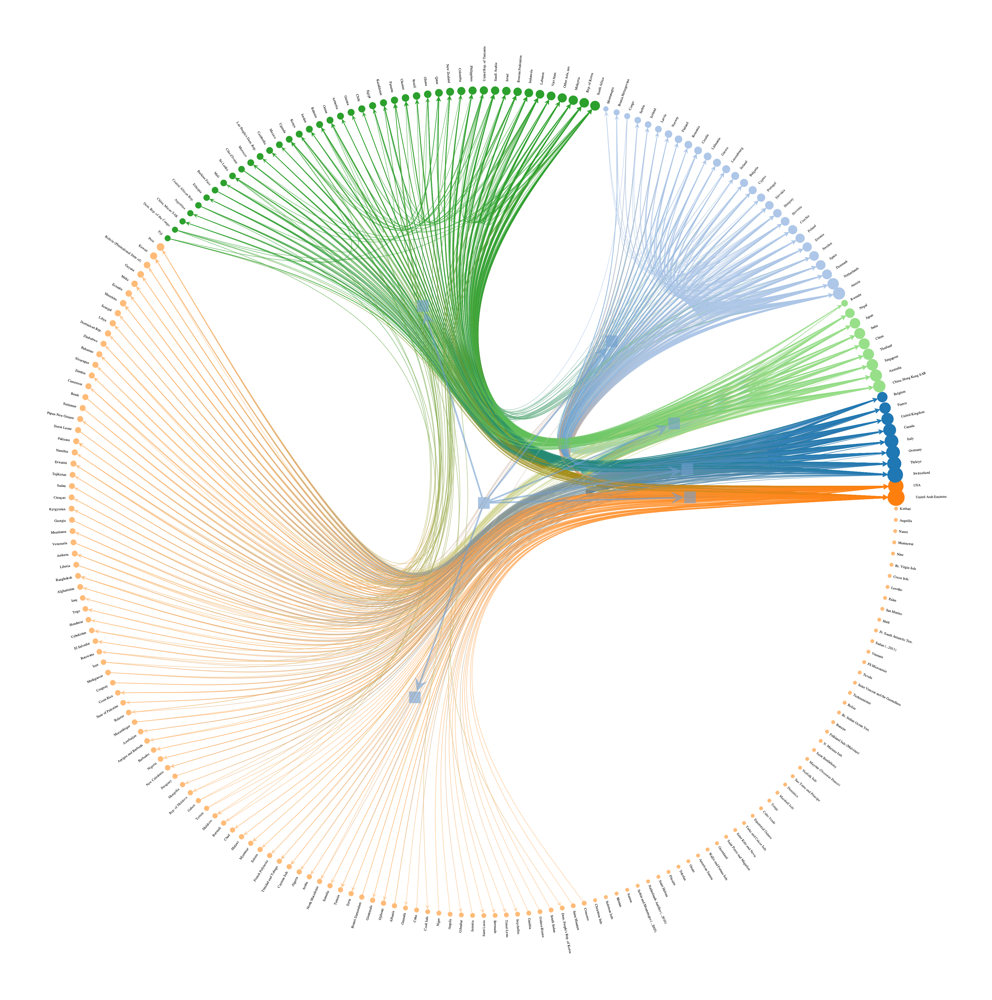

In [66]:
#####################
# WHOLE GRAPH
#####################
product_code_to_visualize = 710812
year_to_visualize = 2020
visualizer.visualize_product_graph(product_code_to_visualize, year_to_visualize)

/var/folders/2b/9cctr7d13y7bhngmhwrk4lgr0000gn/T/ipykernel_27808/597953851.py:188: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



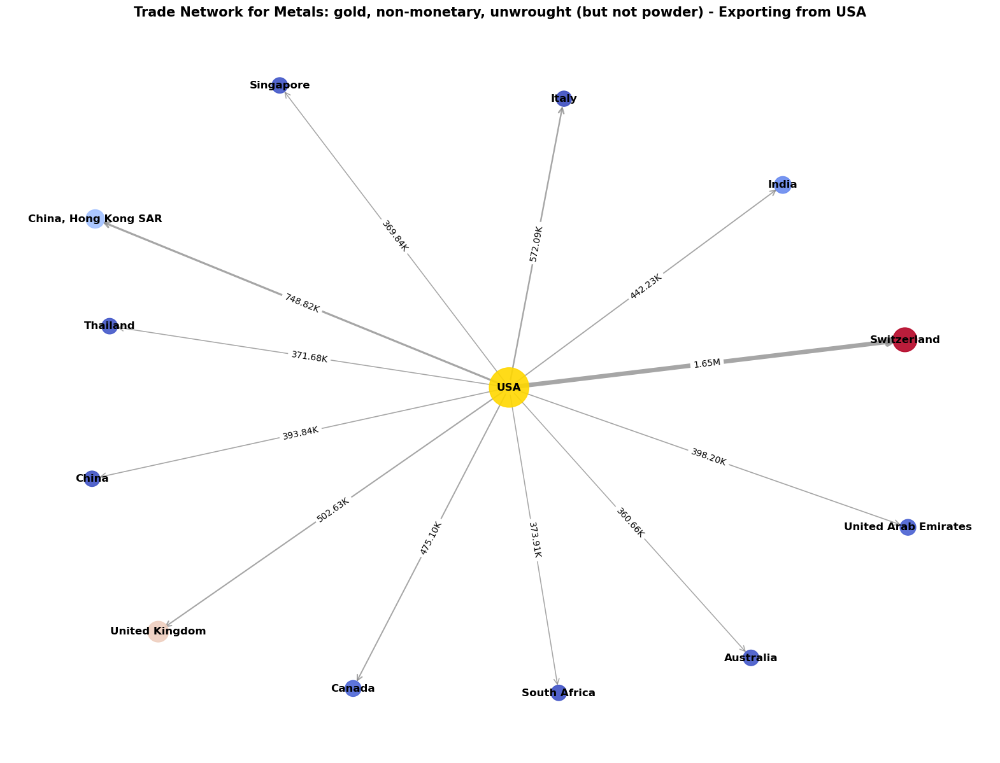

In [67]:
#####################
# SNAPSHOT OF GRAPH
#####################
product_code = 710812
country_name = 'USA'
trade_type = 'export'
visualizer.plot_trade_network(product_code, country_name, trade_type, percentile=0.95)

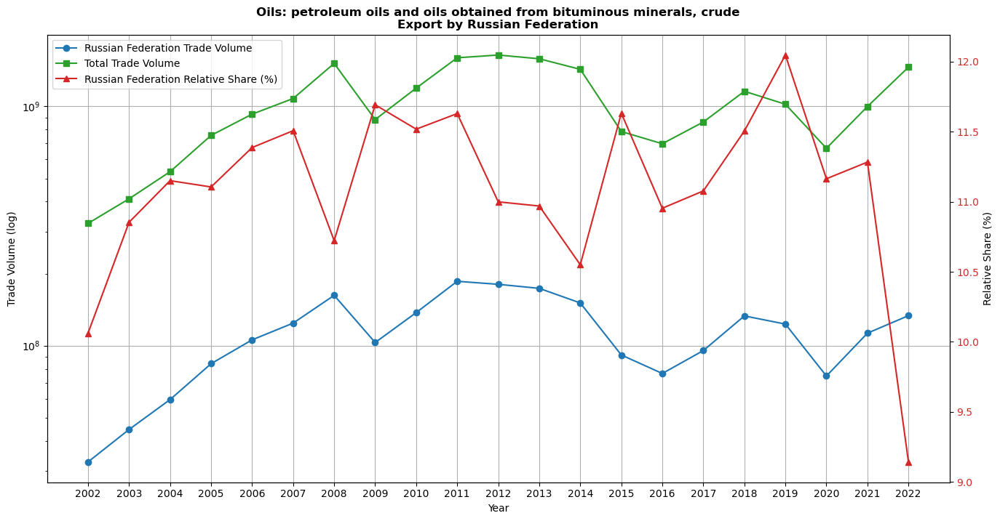

In [68]:
#####################
# TREND OVER TIME
#####################
product_code = 270900
trade_type = "export"
visualizer.plot_trade_over_time(product_code, "Russian Federation", trade_type)

In [69]:
#####################
# DASHBOARD
#####################

product_code = 710812
year_to_visualize = 2022
visualizer.plot_trade_treemap(product_code=product_code, year = year_to_visualize, trade_type='export')

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

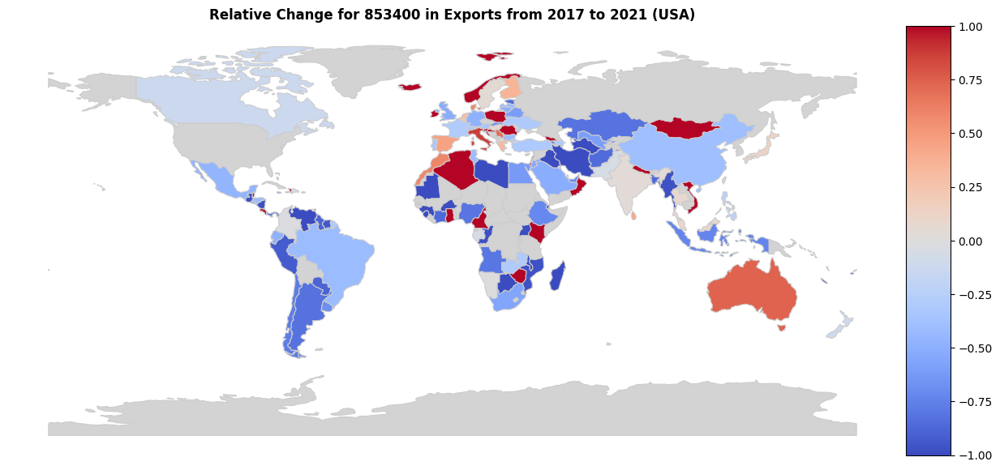

In [ ]:
# Trump 1st term -> semiconductors
visualizer.visualize_trade_changes(
    year1=2017,
    year2=2021,
    trade_type="exports",
    origin_country="USA",
    hso_code=853400
)

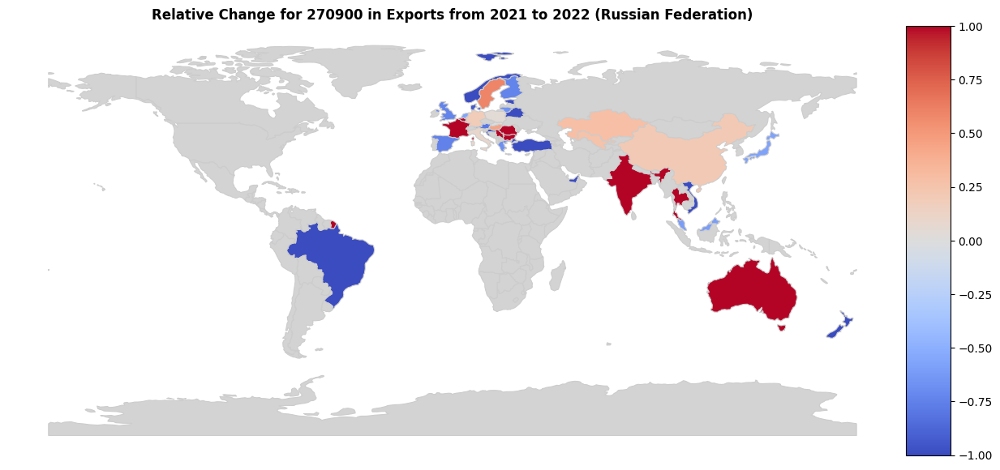

In [ ]:
# Russia Oil

visualizer.visualize_trade_changes(
    year1=2021,
    year2=2022,
    trade_type="exports",
    origin_country="Russian Federation",
    hso_code=270900
)